In [1]:
#we have the text data in 9606.protein.links.v12.0.txt

#we can load in the text file and then find the protein-protein interactions

#first load libraries and cv

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import *
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
cv = CV(dataloader)

In [6]:
#now we will load in this text file and find the interactions, let's first make sure all of our proteins are in the text file

ppi_dict = {}
textfile = '9606.protein.info.v12.0.txt'

with open(textfile, 'r') as file:
    # Skip the header
    next(file)
    
    # Iterate over lines
    for line in file:
        parts = line.split('\t')
        
        # If there are at least two parts
        if len(parts) >= 2:
            key = parts[1]
            value = parts[0]
            ppi_dict[key] = value

print(len(ppi_dict.keys()))


19699


In [18]:
#we also have a protein_dict in cv
#print(cv.p_dict.keys())

#go through each protein in cv.p_dict and make sure it is in ppi_dict
errors = 0
for protein in cv.p_dict:
    if cv.p_dict[protein][0] not in ppi_dict.keys():
        errors += 1
        
print(errors)

#out of the entire list only 44 aren't in the ppi_dict, so we can just remove them from the p_dict

44


In [20]:
print(cv.p_cols)
print(cv.p_dict)

[1693. 1719. 1733. ... 1312. 1281. 1284.]
{1: ['A1BG', 'Alpha-1B-glycoprotein'], 2: ['AAMDC', 'Mth938 domain-containing protein'], 3: ['AARSD1', 'Alanyl-tRNA editing protein Aarsd1'], 4: ['ABCA2', 'ATP-binding cassette sub-family A member 2'], 5: ['ABHD14B', 'Protein ABHD14B'], 6: ['ABL1', 'Tyrosine-protein kinase ABL1'], 7: ['ABO', 'Histo-blood group ABO system transferase'], 8: ['ABRAXAS2', 'BRISC complex subunit Abraxas 2'], 9: ['ACAA1', '3-ketoacyl-CoA thiolase, peroxisomal'], 10: ['ACADM', 'Medium-chain specific acyl-CoA dehydrogenase, mitochondrial'], 11: ['ACADSB', 'Short/branched chain specific acyl-CoA dehydrogenase, mitochondrial'], 12: ['ACAN', 'Aggrecan core protein'], 13: ['ACE', 'Angiotensin-converting enzyme'], 14: ['ACE2', 'Angiotensin-converting enzyme 2'], 15: ['ACHE', 'Acetylcholinesterase'], 16: ['ACOT13', 'Acyl-coenzyme A thioesterase 13'], 17: ['ACOX1', 'Peroxisomal acyl-coenzyme A oxidase 1'], 18: ['ACP1', 'Low molecular weight phosphotyrosine protein phosphatase

In [37]:
#now let's check how many are not in the ppi_dict

col_remove = []
for p_idx in cv.p_dict.keys():
    if cv.p_dict[p_idx][0] not in ppi_dict.keys() and p_idx in cv.p_cols:
        col_remove.append(p_idx)
        print(cv.p_dict[p_idx][0])

print(col_remove.__len__())
#basically we go through the keys are are just numbers 1:2000 something, then we compared to see if it's in our ppi network, some proteins excluded, of them only 33 proteins are excluded
#manually checked some, and indeed they are exluded, but we should still be fine, let's remove those columns from out p_datas

#also was careful, make sure p_idx is in p_cols, initially wasn't doing that so no overlap at all!

CKMT1A_CKMT1B
EBI3_IL27
FUT3_FUT5
GOLM2
IL12A_IL12B
LGALS7_LGALS7B
MICB_MICA
NTproBNP
PNLIPRP2
VEGFA
WARS
11


In [38]:
#only 33 are not in there that we have in the columns, but this is completely fine, the columsn correspond to the protein columns, and this is getting a bit complex

#let's just delete them

def remove_cols(prot, p_cols, col_labels):
    #this function removes the columns from the data, this is if there are certain proteins not in our ppi network
    idx_rm = np.where(np.isin(p_cols, col_labels))[0]
    p_cols = np.delete(p_cols, idx_rm)
    prot = np.delete(prot, idx_rm, axis = 1)
    return p_cols,prot

print(cv.prot.shape)
print(cv.p_cols.shape)

cols,prot = remove_cols(cv.prot, cv.p_cols, col_remove)

print(cols.shape)
print(prot.shape)

(25818, 1039)
(1039,)
(1028,)
(25818, 1028)


In [36]:
np.where(np.isin(cv.p_cols, col_remove))
print(cv.p_cols[0:10])
print(col_remove[0:10])

[1693. 1719. 1733. 1732. 1730. 1729. 1721. 1718. 1717. 1711.]
[91, 113, 128, 238, 276, 286, 298, 528, 531, 533]


In [39]:
ppi_dict

{'ARF5': '9606.ENSP00000000233',
 'M6PR': '9606.ENSP00000000412',
 'FKBP4': '9606.ENSP00000001008',
 'CYP26B1': '9606.ENSP00000001146',
 'NDUFAF7': '9606.ENSP00000002125',
 'FUCA2': '9606.ENSP00000002165',
 'HS3ST1': '9606.ENSP00000002596',
 'SEMA3F': '9606.ENSP00000002829',
 'CFTR': '9606.ENSP00000003084',
 'CYP51A1': '9606.ENSP00000003100',
 'USP28': '9606.ENSP00000003302',
 'SLC7A2': '9606.ENSP00000004531',
 'HSPB6': '9606.ENSP00000004982',
 'PDK4': '9606.ENSP00000005178',
 'USH1C': '9606.ENSP00000005226',
 'RALA': '9606.ENSP00000005257',
 'BAIAP2L1': '9606.ENSP00000005260',
 'CACNG3': '9606.ENSP00000005284',
 'TMEM132A': '9606.ENSP00000005286',
 'DVL2': '9606.ENSP00000005340',
 'RPAP3': '9606.ENSP00000005386',
 'SKAP2': '9606.ENSP00000005587',
 'PRSS21': '9606.ENSP00000005995',
 'HOXA11': '9606.ENSP00000006015',
 'CX3CL1': '9606.ENSP00000006053',
 'TRAPPC6A': '9606.ENSP00000006275',
 'WDR54': '9606.ENSP00000006526',
 'SPATA20': '9606.ENSP00000006658',
 'CEACAM7': '9606.ENSP00000006

In [ ]:
#finally, let's load in the main ppi dataset, we will store it in a matrix using the ppi_dict

# restart with utils to remove columns, ensure shape

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import *
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
ppi.load_info_and_match()

In [2]:
print(ppi.prot.shape)
print(ppi.p_cols.shape)
#yes it works!

(25818, 1028)
(1028,)


In [2]:
ppi.load_ppi()

In [3]:
ppi.ppi.shape

(1028, 1028)

In [4]:
#now let's find the number of nonzeros in ppi.ppi
print(sum(sum(ppi.ppi != 0))) #yeah they're all 0... seems 

0


In [6]:
ppi.p_inv_dict

{'A1BG': 1,
 'AAMDC': 2,
 'AARSD1': 3,
 'ABCA2': 4,
 'ABHD14B': 5,
 'ABL1': 6,
 'ABO': 7,
 'ABRAXAS2': 8,
 'ACAA1': 9,
 'ACADM': 10,
 'ACADSB': 11,
 'ACAN': 12,
 'ACE': 13,
 'ACE2': 14,
 'ACHE': 15,
 'ACOT13': 16,
 'ACOX1': 17,
 'ACP1': 18,
 'ACP5': 19,
 'ACP6': 20,
 'ACRBP': 21,
 'ACRV1': 22,
 'ACSL1': 23,
 'ACTA2': 24,
 'ACTN2': 25,
 'ACTN4': 26,
 'ACVRL1': 27,
 'ACY1': 28,
 'ACY3': 29,
 'ACYP1': 30,
 'ADA': 31,
 'ADA2': 32,
 'ADAM12': 33,
 'ADAM15': 34,
 'ADAM22': 35,
 'ADAM23': 36,
 'ADAM8': 37,
 'ADAM9': 38,
 'ADAMTS1': 39,
 'ADAMTS13': 40,
 'ADAMTS15': 41,
 'ADAMTS16': 42,
 'ADAMTS4': 43,
 'ADAMTS8': 44,
 'ADAMTSL2': 45,
 'ADAMTSL4': 46,
 'ADAMTSL5': 47,
 'ADCYAP1R1': 48,
 'ADD1': 49,
 'ADGRB3': 50,
 'ADGRD1': 51,
 'ADGRE1': 52,
 'ADGRE2': 53,
 'ADGRE5': 54,
 'ADGRF5': 55,
 'ADGRG1': 56,
 'ADGRG2': 57,
 'ADGRV1': 58,
 'ADH1B': 59,
 'ADH4': 60,
 'ADIPOQ': 61,
 'ADM': 62,
 'ADRA2A': 63,
 'AFAP1': 64,
 'AFM': 65,
 'AFP': 66,
 'AGBL2': 67,
 'AGER': 68,
 'AGR2': 69,
 'AGR3': 70,
 'AGR

In [14]:
len(ppi.ppi_e2p.keys())

19699

In [3]:
#now we will load in the ppi network and store it in an adjacency matrix
textfile = '9606.protein.links.v12.0.txt'
p_inv_dict = ppi.p_inv_dict
ppi_e2p = ppi.ppi_e2p
p_cols = ppi.p_cols
tempppi = np.zeros((len(p_cols), len(p_cols)))
with open(textfile, 'r') as file:
    # Skip the header
    next(file)
    counter = 0
    # Iterate over lines
    for line in file:
        parts = line.split(' ')
        counter+=1
        # If there are at least two parts
        if len(parts) >= 2:
            if counter < 5:
                print(parts)
            key1 = ppi_e2p[parts[0]]
            key2 = ppi_e2p[parts[1]]
            if key1 in p_inv_dict and key2 in p_inv_dict:
                print('pass1')
                t1 = p_inv_dict[key1]
                t2 = p_inv_dict[key2]
                value = parts[2][:-1] #defines keys and values
                if t1 in p_cols and t2 in p_cols: #first makes sure it exists in there
                    print('true!')
                    idx1 = np.where(p_cols == int(t1))[0][0] #finds the index of protein 1
                    idx2 = np.where(p_cols == int(t2))[0][0] #and for protein 2
                    tempppi[idx1, idx2] = value #finally assigns it to 1,2

['9606.ENSP00000000233', '9606.ENSP00000356607', '173\n']
['9606.ENSP00000000233', '9606.ENSP00000427567', '154\n']
['9606.ENSP00000000233', '9606.ENSP00000253413', '151\n']
['9606.ENSP00000000233', '9606.ENSP00000493357', '471\n']
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
pass1
true!
pass1
pass1
true!
pass1
true!
pass1
pass1
pass1
pass1
pass1
true!
pass1
pass1
pass1
pass1
true!
pass1
pass1
pass1
pass1
true!
pass1


In [6]:
#now find number of non zero values in ppi
print(sum(sum(tempppi != 0))) #why only diagonals??
print(sum(sum(tempppi == 0))) #not that bad, about 1/10!

155086
901698


In [5]:
print(key1)
print(p_inv_dict)

9606.ENSP00000501317
{'A1BG': 1, 'AAMDC': 2, 'AARSD1': 3, 'ABCA2': 4, 'ABHD14B': 5, 'ABL1': 6, 'ABO': 7, 'ABRAXAS2': 8, 'ACAA1': 9, 'ACADM': 10, 'ACADSB': 11, 'ACAN': 12, 'ACE': 13, 'ACE2': 14, 'ACHE': 15, 'ACOT13': 16, 'ACOX1': 17, 'ACP1': 18, 'ACP5': 19, 'ACP6': 20, 'ACRBP': 21, 'ACRV1': 22, 'ACSL1': 23, 'ACTA2': 24, 'ACTN2': 25, 'ACTN4': 26, 'ACVRL1': 27, 'ACY1': 28, 'ACY3': 29, 'ACYP1': 30, 'ADA': 31, 'ADA2': 32, 'ADAM12': 33, 'ADAM15': 34, 'ADAM22': 35, 'ADAM23': 36, 'ADAM8': 37, 'ADAM9': 38, 'ADAMTS1': 39, 'ADAMTS13': 40, 'ADAMTS15': 41, 'ADAMTS16': 42, 'ADAMTS4': 43, 'ADAMTS8': 44, 'ADAMTSL2': 45, 'ADAMTSL4': 46, 'ADAMTSL5': 47, 'ADCYAP1R1': 48, 'ADD1': 49, 'ADGRB3': 50, 'ADGRD1': 51, 'ADGRE1': 52, 'ADGRE2': 53, 'ADGRE5': 54, 'ADGRF5': 55, 'ADGRG1': 56, 'ADGRG2': 57, 'ADGRV1': 58, 'ADH1B': 59, 'ADH4': 60, 'ADIPOQ': 61, 'ADM': 62, 'ADRA2A': 63, 'AFAP1': 64, 'AFM': 65, 'AFP': 66, 'AGBL2': 67, 'AGER': 68, 'AGR2': 69, 'AGR3': 70, 'AGRN': 71, 'AGRP': 72, 'AGT': 73, 'AGXT': 74, 'AHCY'

In [14]:
print(np.where(p_cols == 1693)[0][0])
print(p_inv_dict[t1])
print(p_cols)


0
1651
[1693. 1719. 1733. ... 1312. 1281. 1284.]


In [1]:
#retest!
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import *
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)


<Axes: >

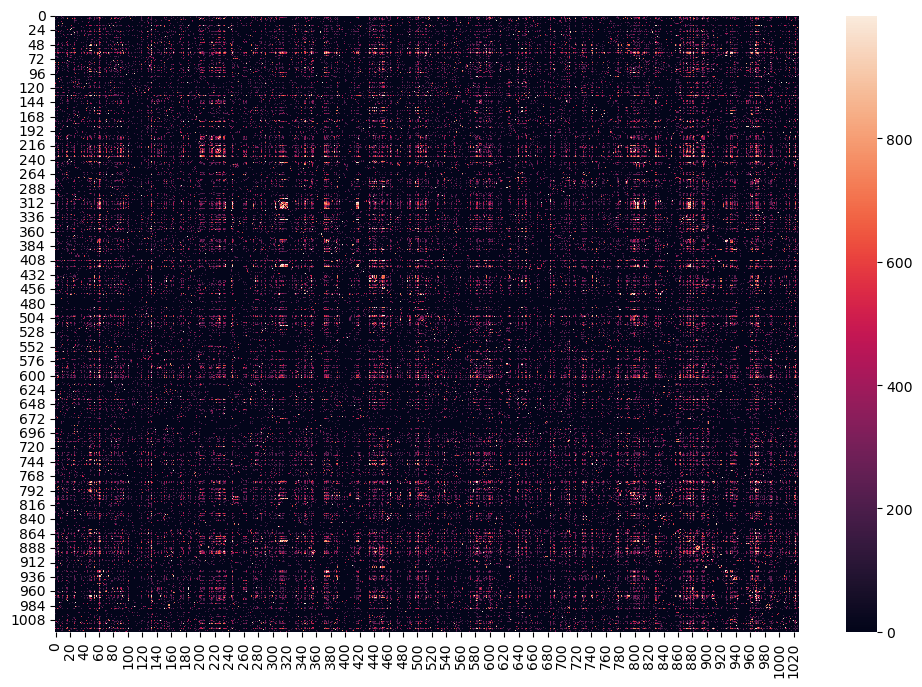

In [6]:
#do a heatmap of ppi
plt.figure(figsize=(12,8))
sns.heatmap(ppi.ppi)

In [3]:
#check if it is symmetric
print(np.allclose(ppi.ppi, ppi.ppi.T, atol=1e-8))
#it is indeed symmetric, but not filled symmetrically, just happens to work out

True


In [9]:
#once again check the ratio of zeros to non zeros in the matrix
tot_non0 = sum(sum(ppi.ppi != 0))
tot_0 = sum(sum(ppi.ppi == 0))

print(tot_non0/tot_0) #ratio of nonzeros to zeros
print(tot_non0/(tot_0+tot_non0)) #ratio of nonzeros to total, about 15%

0.17199328378237502
0.14675278959560326


# visualizing ppi

In [1]:
#we will use network x to visualize the network from the adjacency matrix, first let's go ahead and create a mask, this will be done in creating the ppi

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)

[[0 1 0 1 0]
 [1 0 0 0 0]
 [0 0 0 1 0]
 [1 0 1 0 0]
 [0 0 0 0 0]]


<Axes: >

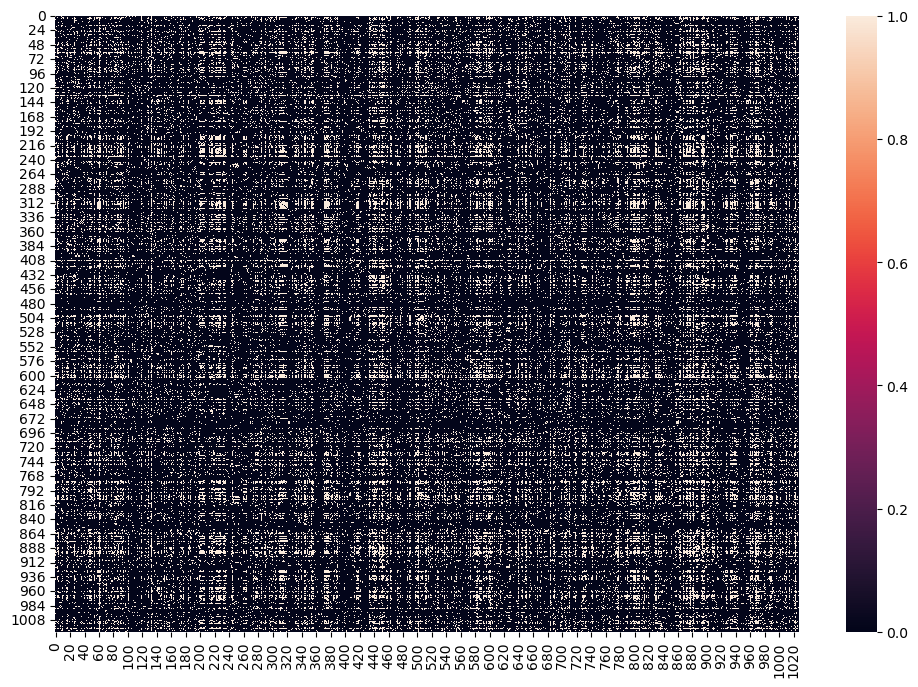

In [2]:
print(ppi.mask[0:5,0:5])
plt.figure(figsize=(12,8))
sns.heatmap(ppi.mask)

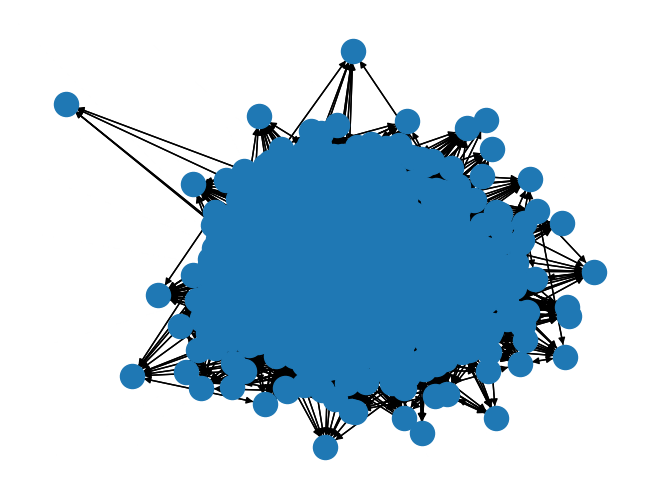

In [4]:
#now use networkx to visualize the network

import networkx as nx

G = nx.DiGraph()

for i in range(ppi.mask.shape[0]):
    for j in range(ppi.mask.shape[1]):
        if ppi.mask[i,j] == 1:
            G.add_edge(i,j)

#now visualize G with small dots
nx.draw(G)

#so it seems they are all connected

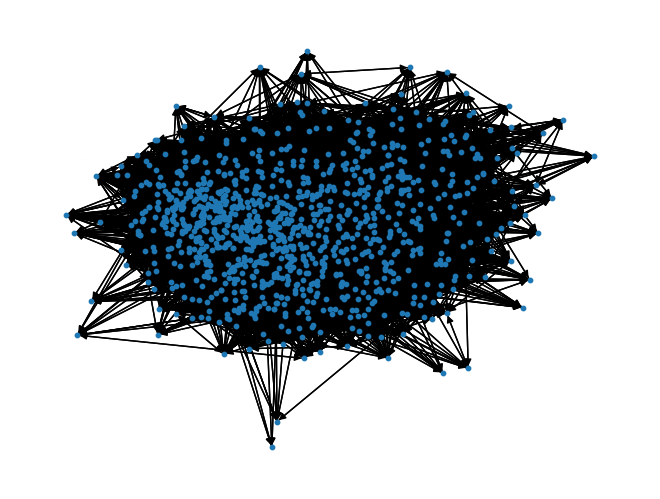

In [5]:
nx.draw(G, node_size=10)

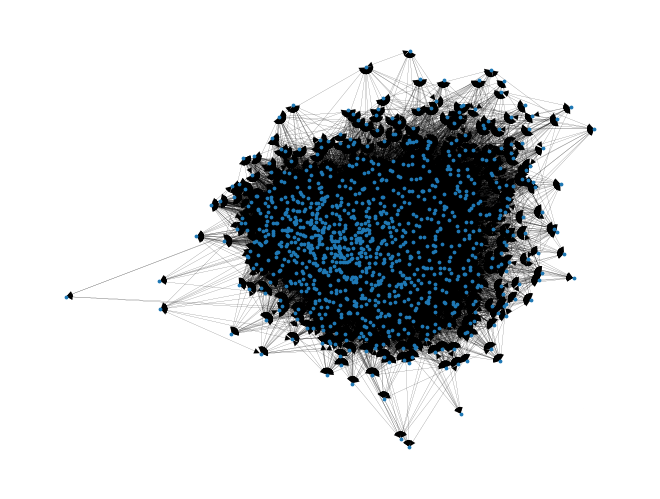

In [6]:
#now also smaller lind width
nx.draw(G, node_size=3, width = 0.05)

# now we do some additional analysis!

gotta figure out what wes things we should do. What are edge weights in his case? Look through my notes and message him...

Not at all helpful... But we have an idea of how to approach it. Let's go ahead and ask chatgpt

In [ ]:
import pyro
import pyro.distributions as dist

def ppi_energy_model(adj_matrix, eta0, eta1, etaij_matrix):
    num_proteins = adj_matrix.shape[0]
    protein_states = pyro.sample("protein_states", dist.Normal(0, 1).expand([num_proteins]))

    # Constant term eta0
    pyro.factor("baseline_energy", eta0)
    
    # Individual protein terms eta1 * yi
    for i in range(num_proteins):
        pyro.factor(f"protein_term_{i}", eta1 * protein_states[i])

    # Pairwise interaction terms sum(yi * yj * etaij)[i != j]
    for i in range(num_proteins):
        for j in range(i + 1, num_proteins):  # Ensure i != j and avoid double-counting
            if adj_matrix[i, j] > 0:
                interaction_energy = protein_states[i] * protein_states[j] * etaij_matrix[i, j]
                pyro.factor(f"interaction_term_{i}_{j}", interaction_energy)


# Austin idea with NF

In [1]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)

In [28]:
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
#let's start with my basic model
def my_model(adj_mat, m = None, n_obs = None, adj_prob = torch.tensor((.1468))):
    #first define the priors
    if m is None:
        m = torch.tensor(np.zeros(5))
    if n_obs is None:
        n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    with obs_plate:
        m = pyro.sample('m', dist.Normal(0,1), obs = m)
        p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    A = pyro.sample('A', dist.Bernoulli(adj_prob), obs = adj_mat)
    #this A is wrong anyways, we'll figure out what's wrong later
    
    #now we define normalizing flow, then define p
    
    
     
    return p

print(p.shape)
sample = my_model(ppi.mask, n_obs = n)
print(sample)

torch.Size([5])
tensor([-0.2271,  0.1271,  1.4285,  2.4672, -1.4599])


In [34]:
#need to somehow linearize A, shouldn't be too bad
adj_lin = np.reshape(ppi.mask, (ppi.mask.shape[0]*ppi.mask.shape[1],1))
print(adj_lin.shape)
#find how many zeros in adj_lin

print(sum(adj_lin == 0))
print(1-sum(adj_lin == 0)/1056784) #percent of non 0s

#yes this works, but really loses the probability that we had before, so not ideal, also 1e6 elements


(1056784, 1)


[901698]
[0.14675279]


In [45]:
#now with this linear thing, let's just input it and see if A is the right shape

def my_model(adj_mat = None, m = None, n_obs = None, adj_prob = torch.tensor((.1468))):
    #first define the priors
    if n_obs is None and m:
        n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    with obs_plate:
        m = pyro.sample('m', dist.Normal(0,1), obs = m)
        p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    A = pyro.sample('A', dist.Bernoulli(adj_prob), obs = adj_mat)
    #this A is wrong anyways, we'll figure out what's wrong later
    
    #now we define normalizing flow, then define p
    
    
     
    return p, A, m
n = 5
p,A,m = my_model(n_obs = 5)
print(A.shape)
print(A)
print(p)
print(m)
#doesn't make sense to generate data and have any observations that isn't None,that's why have to input none
#plate uses n_obs, so only p is used here, that makes a lot of sense. Also yeah A isn't used at all

torch.Size([])
tensor(0.)
tensor([-0.9761,  0.2454, -0.2775,  0.2354,  0.5430])
tensor([ 0.1853, -1.9863,  0.6980,  0.2804,  1.1674])


(0.0, 20000.0)

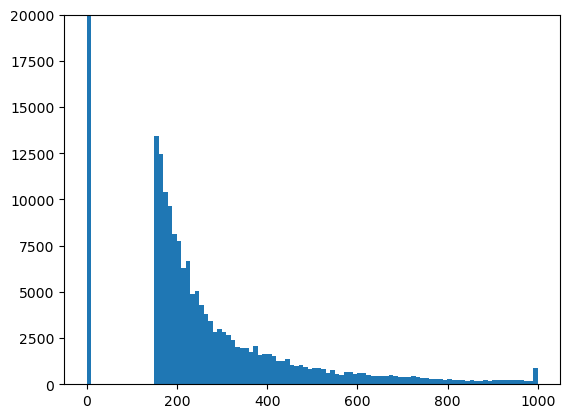

In [50]:
#also just a quick histogram of ppi.ppi values
plt.hist(ppi.ppi.flatten(), bins = 100)
#limit the y axis
plt.ylim(0,20000)

155086


(array([11960.,  9998., 10304.,  8084.,  7980.,  6606.,  6878.,  5060.,
         6242.,  4172.,  4274.,  4150.,  3742.,  2996.,  3206.,  2348.,
         2684.,  2190.,  2632.,  2076.,  2196.,  1610.,  1690.,  1714.,
         1708.,  1520.,  1764.,  1328.,  1454.,  1304.,  1292.,  1284.,
         1122.,  1014.,  1208.,   916.,   880.,   780.,   990.,   696.,
          696.,   694.,   868.,   672.,   654.,   526.,   670.,   460.,
          500.,   504.,   514.,   582.,   446.,   524.,   512.,   514.,
          380.,   408.,   372.,   396.,   354.,   440.,   394.,   374.,
          334.,   356.,   332.,   394.,   328.,   372.,   260.,   250.,
          246.,   262.,   230.,   228.,   216.,   246.,   170.,   230.,
          190.,   172.,   184.,   180.,   136.,   162.,   154.,   154.,
          160.,   192.,   200.,   176.,   176.,   192.,   168.,   204.,
          156.,   160.,   148.,   862.]),
 array([150.  , 158.49, 166.98, 175.47, 183.96, 192.45, 200.94, 209.43,
        217.92, 226.41

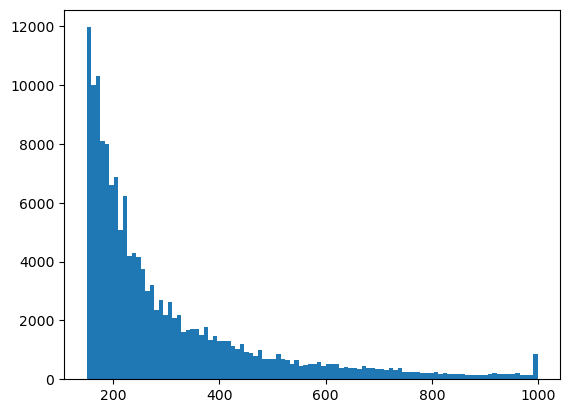

In [55]:
#histogram without the 0 values
nonzero = ppi.ppi.flatten()[ppi.ppi.flatten() != 0]

print(len(nonzero))

#now histogram
plt.hist(nonzero, bins = 100)

In [ ]:
#so we can treat it as some multivariate distribution that we then turn into something

#for now treat it as a bernoulli and use the mask

# pyro part 2, implement bernoulli and do NF

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
#let's start with my basic model

print(ppi.mask.shape)

(1028, 1028)


In [6]:
def ppi_bernoulli_model(num_proteins = 1028, ppi_mask = np.full((1028,1028), fill_value=None), prob = torch.tensor((.1468))):
    adjacency_matrix = torch.zeros((num_proteins, num_proteins))
    
    for i in range(num_proteins):
        for j in range(i + 1, num_proteins): #loop through all following ones, will cause every protein to meet each other one
            interaction = pyro.sample(f"interaction_{i}_{j}", dist.Bernoulli(prob), obs = ppi_mask[i, j])
            adjacency_matrix[i, j] = adjacency_matrix[j, i] = interaction #sets both to the interaction term
    
    return adjacency_matrix

def my_model(adj_mat, m = None, n_obs = None, adj_prob = torch.tensor((.1468))):
    #first define the priors
    if m is None:
        m = torch.tensor(np.zeros(5))
    if n_obs is None:
        n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    with obs_plate:
        m = pyro.sample('m', dist.Normal(0,1), obs = m)
        p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    A = pyro.sample('A', dist.Bernoulli(adj_prob), obs = adj_mat)
    #this A is wrong anyways, we'll figure out what's wrong later
    
    #now we define normalizing flow, then define p
    
    
     
    return p

torch.Size([1028, 1028])


<Axes: >

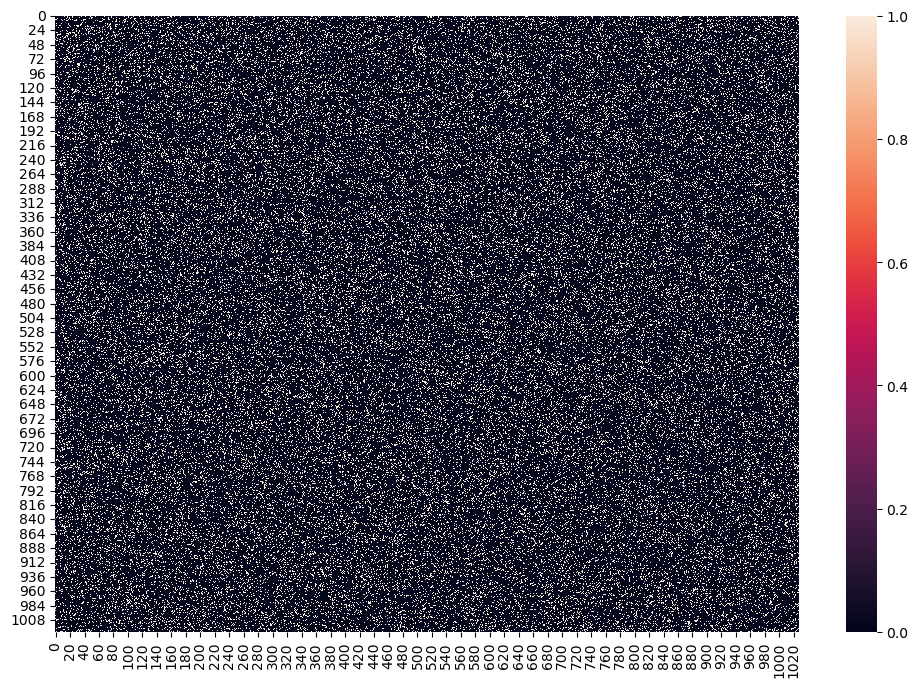

In [7]:
test_a = ppi_bernoulli_model()
print(test_a.shape)
#now plot it as a heatmap

plt.figure(figsize=(12,8))
sns.heatmap(test_a)

In [10]:
#now let us find how many of the values are 0 vs 1

print(sum(sum(test_a == 0)))
print(sum(sum(test_a == 1)))
#now plot the ratio of 1 over the total number of elements
print(sum(sum(test_a == 1))/test_a.shape[0]**2) #quite solid

#do all this again for the ppi.mask
print(sum(sum(ppi.mask == 0)))
print(sum(sum(ppi.mask == 1)))

print(sum(sum(ppi.mask == 1))/ppi.mask.shape[0]**2) #also quite solid

#very similar, definitely doing it right

tensor(902276)
tensor(154508)
tensor(0.1462)
901698
155086
0.14675278959560326


In [ ]:
def ppi_bernoulli_model(num_proteins = 1028, ppi_mask = np.full((1028,1028), fill_value=None), prob = torch.tensor((.1468))):
    adjacency_matrix = torch.zeros((num_proteins, num_proteins))
    
    for i in range(num_proteins):
        for j in range(i + 1, num_proteins): #loop through all following ones, will cause every protein to meet each other one
            interaction = pyro.sample(f"interaction_{i}_{j}", dist.Bernoulli(prob), obs = ppi_mask[i, j])
            adjacency_matrix[i, j] = adjacency_matrix[j, i] = interaction #sets both to the interaction term
    
    return adjacency_matrix

def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = None, adj_prob = torch.tensor((.1468))):
    #first define the priors
    if n_obs is None:
        n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    with obs_plate:
        m = pyro.sample('m', dist.Normal(0,1), obs = m)
        p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    #this A is wrong anyways, we'll figure out what's wrong later
    
    #now we define normalizing flow, then define p
    
    
     
    return p

now I would like the use the adjacency matrix data via a normalizing flow conditioned on the metabolite data. This is what I have so far

So we use normalizing flow via a binomial, this binomial will let us map it back to an adjacency matrix, but agian binomial isn't really that good, because normally interactions would be dependent
My independent assumptions are wrong, but it's for the sake of testing it, can implement MRF or use that as the original distribution if this works

So what we do is linearize my adjacency matrix and make it a binomial prediction, then we turn this binomial into some other kind of continuous prediction conditioned on metabolites.
Sample form this to get the same number of points, this will be our updated model weights.

Finally, we can do some sort of regression to predict proteins from there, but this could be complex, where proteins are sampled from there with some mean given by this distribution. Maybe no need any sort of regression? No we do need it because will get adjacency matrix, so still need it!

The to dos after are demographics and of course make it a MRF instead of binomial

# implementing linearize and adj_mat

In [14]:
def linearize_adj_matrix(adj_matrix):
    # Take the upper triangular part of the matrix, excluding the diagonal
    upper_tri = adj_matrix[np.triu_indices_from(adj_matrix, k=1)]
    return upper_tri

A = [[0,1,1,1,2],[0,0,3,1,1],[0,0,0,1,1],[0,0,0,0,1],[0,0,0,0,0]]
A = np.array(A)

print(linearize_adj_matrix(A))
print(linearize_adj_matrix(A).shape)
#seems to work as intended, and now change one of the elemtns to a 2, see if it works

[1 1 1 2 3 1 1 1 1 1]
(10,)


In [15]:
#now try the inverse
B = linearize_adj_matrix(A)

def expand_linearized_form(linearized, num_nodes):
    # Create an empty adjacency matrix
    adj_matrix = np.zeros((num_nodes, num_nodes), dtype=linearized.dtype)
    
    # Fill the upper triangular part of the matrix
    adj_matrix[np.triu_indices_from(adj_matrix, k=1)] = linearized
    
    # Since the graph is undirected, mirror the upper triangular part to the lower part
    adj_matrix = adj_matrix + adj_matrix.T
    return adj_matrix

print(expand_linearized_form(B, 5))
print(expand_linearized_form(B, 5).shape)

[[0 1 1 1 2]
 [1 0 3 1 1]
 [1 3 0 1 1]
 [1 1 1 0 1]
 [2 1 1 1 0]]
(5, 5)


In [18]:
#make A symmetric by adding A.T

sym = A + A.T
linear = linearize_adj_matrix(sym)
print(sym)
print(linear)
print(expand_linearized_form(linear, 5))

#we didn't have it as symmetric the first time, lsot the info, but we reconstructed it so we're all good!

[[0 1 1 1 2]
 [1 0 3 1 1]
 [1 3 0 1 1]
 [1 1 1 0 1]
 [2 1 1 1 0]]
[1 1 1 2 3 1 1 1 1 1]
[[0 1 1 1 2]
 [1 0 3 1 1]
 [1 3 0 1 1]
 [1 1 1 0 1]
 [2 1 1 1 0]]


In [19]:
#final test is with the ppi.mask
#check if they are the same

linearized = linearize_adj_matrix(ppi.mask)
print(linearized.shape)

#now expand it
expanded = expand_linearized_form(linearized, 1028)
print(expanded.shape)

#now check if they are the same
print(np.allclose(ppi.mask, expanded, atol=1e-8))

(527878,)
(1028, 1028)
True


# final high level overview

The basic idea is we will treat the adjacency matrix as a linearized binomial. Then we will use that as the input for our normalizing flow conditioned on metabolites. Whatever we get back we will turn to an adjacency matrix. Then we will find some way to predict from there

That then begs the question why not just learn the weights for the MRF directly from the metabolites? Holy fuck, Wes was right the whole time?

In [ ]:
import numpy as np
import torch
import pyro
import pyro.distributions as dist

def protein_interaction_model(num_proteins, metabolites):
    for i in range(num_proteins):
        for j in range(i+1, num_proteins):
            # Feature vector derived from metabolites affecting the interaction
            metabolite_features = ... # Define how metabolite data influences the interaction

            # Modeling the conditional probability of interaction
            interaction_prob = torch.sigmoid(some_function_of(metabolite_features))
            interaction = pyro.sample(f"interaction_{i}_{j}", dist.Bernoulli(interaction_prob))

            # Update adjacency matrix (or other structure) accordingly
            # ...

    # Further modeling based on the constructed network
    # ...


So this above approach with the sigmoid uses th eprobabilities to construct whether or not there is an edge. It uses the previously known network and updates it, we could instead just update thigns directly. We could instead learn these eta0, eta1, and eta interaction terms directly. This doesn't include already known interactions. WAit, yeah, for each node it's conditionally independent of the others. But that means that we need all of them to find the edge? No for the edge I think this approach will work... maybe let's try this! This is where it gets toof ar and I am lost but basic summary

Go from adjacency matrix to update based on some features of the metabolites. Maybe not for each edge independently but maybe? This we h ave to think on. 

The other issue is that we need to predict, otherwise what's the labels?

I think we will predict proteins, and so what we use is for now just th enumber of connections, the actual approach to use is somewhat difficult an dcomplex, and I'm really not quite sure... who knows dude! But this middle adjacency matrix can be pro! I guess we'll use th emetabolites twice, but like idk, just le thim know and can alter my model afterwards

Also, right now we aren't updating the eta values, should probably do that. But that can be a later thing, for now we'll just find a way to represent things in my model, those are later updates to do instead

# first implement a neural network to predict these values from the metabolites

Final model is this. We use metabolite to get information some neural network with that large output that is dot product with the interaction thing. Then this thing along with the metabolites is used for regression, then we see most significant weights for the highest achieving ones, can see biggest weights normalized as well!

try with mask and values, justification is testing it, also many are useless interactions predictionwise, often only signifcant cuz know they interact, but maybe not meaningful in the prediction. Also, it is an easy version to implement, openbugs or some other approach is alternative, will replace with a MRF, but then confused about prediction from there. Edge weights of prior have nothing to do with concentration relationships, but maybe we can use these correlations to update the weights...

Let's also do the thing where we update our model with protein data if we have th etime. MAybe that is more informative than the entire PPI network, that is a next step and then of course replacing the model with the PPI

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
#let's start with my basic model

print(ppi.mask.shape)
linearized = ppi.linearize(ppi.mask)
print(linearized.shape)


(1028, 1028)
(527878,)


In [3]:
#we first need to turn it to pandas dataframes, you'll see why

#turn ppi.prot into a dataframe with the headers being ppi.p_dict[ppi.p_cols]

#first make a list of the headers
headers = []
for p_idx in ppi.p_cols:
    headers.append(ppi.p_dict[p_idx][0])
print(headers)

#now turn to dataframe
df = pd.DataFrame(ppi.prot, columns = headers)
print(df.shape)
df.head()

['MDK', 'MIA', 'MMP12', 'MMP10', 'MME', 'MLN', 'MGMT', 'MGLL', 'METAP2', 'METAP1D', 'MERTK', 'MEPE', 'MEGF10', 'LTBR', 'LY6D', 'LY75', 'LYN', 'LYPD3', 'MATN2', 'MANF', 'MANSC1', 'MAP2K6', 'MAPK9', 'NPPC', 'NECTIN4', 'NTF3', 'NT5E', 'NT5C3A', 'NPY', 'NCS1', 'NME3', 'NFATC1', 'NFASC', 'NELL2', 'MPI', 'MPIG6B', 'MSLN', 'MSRA', 'MUC16', 'MZB1', 'MOG', 'NBL1', 'NCF2', 'NCK2', 'NCR1', 'NELL1', 'LTA4H', 'ITGA6', 'ITGAV', 'ITGB5', 'ITGB7', 'ITM2A', 'ISM1', 'KAZALD1', 'KDR', 'KIFBP', 'KLK10', 'ITGA11', 'IL5RA', 'IL32', 'IL4R', 'IL6', 'IL7', 'INPP1', 'INPPL1', 'IQGAP2', 'IRAK4', 'KLK11', 'LEFTY2', 'LGALS4', 'LGALS9', 'LGMN', 'LHPP', 'LIFR', 'LAT', 'LPCAT2', 'LRIG1', 'LRP1', 'LRRC25', 'LSP1', 'LAT2', 'KRT19', 'KLK14', 'KLK4', 'KLK6', 'KLRB1', 'KLRD1', 'KRT18', 'KYNU', 'L1CAM', 'LAG3', 'LAIR1', 'LAMA4', 'LAMP3', 'LTA', 'SEMA4C', 'SCG3', 'SCGB1A1', 'SCGB3A2', 'SCLY', 'SCRN1', 'SELPLG', 'SCAMP3', 'SEPTIN9', 'SERPINA9', 'SERPINB8', 'SEZ6L', 'SEZ6L2', 'SF3B4', 'SCG2', 'REG4', 'RET', 'RILP', 'ROBO1', '

,MDK,MIA,MMP12,MMP10,MME,MLN,MGMT,MGLL,METAP2,METAP1D,...,PLPBP,PLTP,GRAP2,GRN,ICAM1,HSPG2,HYAL1,HYOU1,HMOX1,HNMT
0,0.141347,-0.634923,1.601085,0.851576,1.996996,0.993545,0.692143,0.924245,0.799389,0.182881,...,0.868104,-0.076874,1.177368,-0.527711,-0.072634,-0.587500,-0.168412,0.939287,0.604464,-1.369125
1,1.320580,1.551708,1.344447,0.992818,-0.910269,-0.061531,0.252792,0.822925,0.843837,0.606561,...,0.836307,0.262923,0.711489,-0.735567,-0.967735,0.791910,-0.327647,-0.392356,-0.653042,-0.150033
2,-0.310808,0.180980,-0.754796,-1.265399,-0.753325,1.725667,-0.349388,-0.373826,-0.443087,-0.113979,...,-0.904283,-0.162846,-0.705074,-1.000436,-0.334975,-0.926501,0.320656,-0.374629,-0.344579,-0.343333
3,-0.571208,0.112789,0.698908,1.200094,2.260867,-0.092641,0.998861,0.861504,0.936099,1.057745,...,0.889657,-1.683217,0.662459,0.262785,-0.111126,-0.048850,0.301401,0.586926,-2.423720,0.082385
4,0.115065,-0.924257,0.496153,0.885872,0.901185,-1.193196,-0.009237,-0.032263,0.124561,-0.485436,...,0.583926,1.942022,-0.383343,-0.069284,1.100502,-0.205252,0.363401,-0.462867,0.576524,-1.409388


In [4]:
#what we will do is use the correlations to update the edges or values in my matrix
#but we will use partial correlations based on other connected proteins
updated_ppi = np.zeros((ppi.mask.shape))
for i in tqdm(range(ppi.mask.shape[0])):
    for j in range(i + 1, ppi.mask.shape[0]):
        if ppi.mask[i,j] == 1:
            #now we find the correlation and condition it on all the other values in the row that are 1
            #first find the indices of the other 1s in the row
            idx = np.where(ppi.mask[i,:] == 1)[0]
            idx = idx[idx != j]  # Exclude the current column protein
            
            #now we will find th eproteins to condition it on
            # cond = ppi.prot[:,idx]
            x = ppi.p_dict[ppi.p_cols[i]][0]
            y = ppi.p_dict[ppi.p_cols[j]][0]
            cond_list = []
            for c in idx:
                cond_list.append(ppi.p_dict[ppi.p_cols[c]][0])
            # print(x)
            # print(y)
            # print(cond_list)
            #now we will find the partial correlation
            pcorr = pg.partial_corr(df, x, y, cond_list)
            updated_ppi[i, j] = updated_ppi[j, i] = pcorr['r'].values[0]

  1%|▏         | 13/1028 [03:29<4:32:14, 16.09s/it]


KeyboardInterrupt: 

<Axes: >

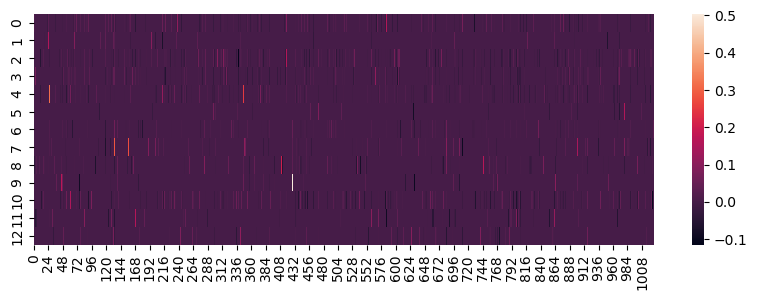

In [8]:
#the first 13 are done, so let's plot it
plt.figure(figsize=(10,3))
sns.heatmap(updated_ppi[0:13,:])

<Axes: >

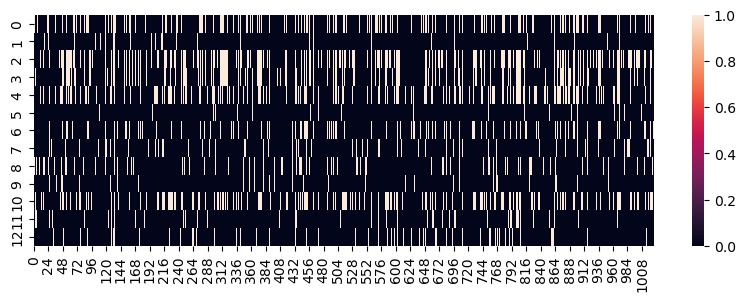

In [9]:
plt.figure(figsize=(10,3))
sns.heatmap(ppi.mask[0:13,:])

In [11]:
#check if all the 0 values match
a = updated_ppi[0:11,:]
b = ppi.mask[0:11,:]

print(sum(sum(a == 0)))
print(sum(sum(b == 0)))
print(sum(sum(a!=0)))
print(sum(sum(b!=0)))

#so we see they definitely match, but many of the correlations are much smaller!

9476
9476
1832
1832


## now simple model

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
print(ppi.met.shape)

(25818, 251)


In [13]:
print(ppi.linearize(ppi.mask).shape)

(527878,)


In [15]:
#and find number of non0 in lienarize
print(sum(ppi.linearize(ppi.mask) != 0)) #roughly 77543 output, that's a large network

77543


In [ ]:
#we are running the other correlations elsewhere, so we can run some stuff here

#here is the hihg level skeleton code directly from chatgpt

import torch
import pyro
import pyro.distributions as dist

# Neural Network Definition (using PyTorch)
class PPI_Net(torch.nn.Module):
    def __init__(self):
        super(PPI_Net, self).__init__()
        # Define layers

    def forward(self, metabolites):
        # Forward pass logic
        return updated_ppi_params

# Pyro Model
def model(metabolite_data, protein_data=None):
    # Pass metabolite data through the neural network
    updated_ppi_params = ppi_net(metabolite_data)
    
    # Update PPI network (logic depends on your implementation)
    
    # Linear regression prediction
    prediction_mean = linear_layer(updated_ppi_network_features)
    
    # Observation model (assuming normal distribution for simplicity)
    with pyro.plate('data', size=metabolite_data.shape[0]):
        pyro.sample('obs', dist.Normal(prediction_mean, scale), obs=protein_data)

# Pyro Guide
def guide(metabolite_data, protein_data=None):
    # Similar structure as model but defines variational parameters for inference
    pass

# Inference
optimizer = pyro.optim.Adam({"lr": 1e-3})
svi = pyro.infer.SVI(model, guide, optimizer, loss=pyro.infer.Trace_ELBO())

# Training Loop
for step in range(num_steps):
    loss = svi.step(metabolite_data, protein_data)
    if step % 100 == 0:
        print(f"Step {step} : loss = {loss}")

#the parameters of the neural network will be trained alongside the rest of the model within Pyro's probabilistic modeling and inference framework

#and here is what I had before
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = None, adj_prob = torch.tensor((.1468))):
    #first define the priors
    if n_obs is None:
        n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    with obs_plate:
        m = pyro.sample('m', dist.Normal(0,1), obs = m)
        p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    
import numpy as np
import torch
import pyro
import pyro.distributions as dist

def protein_interaction_model(num_proteins, metabolites):
    for i in range(num_proteins):
        for j in range(i+1, num_proteins):
            # Feature vector derived from metabolites affecting the interaction
            metabolite_features = ... # Define how metabolite data influences the interaction

            # Modeling the conditional probability of interaction
            interaction_prob = torch.sigmoid(some_function_of(metabolite_features))
            interaction = pyro.sample(f"interaction_{i}_{j}", dist.Bernoulli(interaction_prob))

            # Update adjacency matrix (or other structure) accordingly
            # ...

    # Further modeling based on the constructed network
    # ...


In [2]:
#first properly define the neural network, let's just do 2 simple layers and then this approximates the values of the interaction network
import torch.nn as nn
class PPI_Net(torch.nn.Module):
    def __init__(self):
        super(PPI_Net, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(251, 500)  # First linear layer
        self.layer2 = nn.Linear(500, 1000)  # Intermediate layer
        self.layer3 = nn.Linear(1000, 77543)  # Second linear layer

    def forward(self, metabolites):
        # Forward pass logic
        x = nn.functional.relu(self.layer1(metabolites))  # Applying ReLU after first layer
        x = nn.functional.relu(self.layer2(x))  # Applying ReLU after intermediate layer
        x = self.layer3(x)
        return x
    
#see how l arge the model is
ppi_net = PPI_Net()


def model_size_in_mb(model):
    total_size = 0
    for param in model.parameters():
        # Assuming parameters are stored in 32-bit precision (4 bytes)
        param_size = param.numel() * 4  # numel() gives the total number of elements
        total_size += param_size

    total_size_mb = total_size / (1024 * 1024)  # Convert to megabytes
    return total_size_mb

# Example usage with your model
size_in_mb = model_size_in_mb(ppi_net)
print(f"Model size: {size_in_mb} MB")

#so we have a model, this is more a proof of concept anyways

Model size: 298.4906883239746 MB


In [7]:
#now we can define parts of the model, what we will do is define everything in the model without a guide for now, let's see if it works

# Pyro Model
def model(metabolite_data, protein_data=None):
    # Pass metabolite data through the neural network
    updated_ppi_params = ppi_net(metabolite_data)
    
    # Update PPI network (logic depends on your implementation)
    
    # Linear regression prediction
    prediction_mean = linear_layer(updated_ppi_network_features)
    
    # Observation model (assuming normal distribution for simplicity)
    with pyro.plate('data', size=metabolite_data.shape[0]):
        pyro.sample('obs', dist.Normal(prediction_mean, scale), obs=protein_data)


#and here is what I had before
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468))):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)
    # Assuming each column has its own mean and standard deviation, we know it is 0 and 1 since it's been preprocessed
    means = torch.zeros(251)
    stds = torch.ones(251)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)
        #p = pyro.sample('p', dist.Normal(0,1))
    #now we will add the adjacency matrix
    print(m.shape)
    return m
    return 0
    updated_ppi_params = ppi_net(m)
    
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    linearize = torch.tensor(linearize)
    nonzero = linearize.nonzero().squeeze()
    linearize[nonzero] += updated_ppi_params
    
    with obs_plate:
        p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
        p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
        p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
#pyro.render_model(my_model, model_args=(ppi.mask,))
print(ppi.met.shape)
p = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])
print(p)

(25818, 251)
torch.Size([25818, 251])
tensor([[ 0.0194, -0.8898,  0.2682,  ..., -2.8798, -0.1806,  1.8360],
        [-0.2590, -1.8161, -0.5724,  ..., -0.6537, -0.9054,  0.4421],
        [-0.5320, -0.3327, -0.6501,  ...,  1.0853, -0.1299, -0.5030],
        ...,
        [ 2.4690,  0.7875,  1.0902,  ..., -3.1892,  1.9706,  2.4386],
        [-0.6330, -0.1367, -1.2095,  ...,  0.1220, -1.0265,  0.7754],
        [-0.4716, -0.3205, -1.0593,  ..., -0.2447, -0.9420, -0.0946]])


In [11]:
ppi.met-p.numpy() #can see near identical uses the data!

array([[ 3.09157908e-10, -1.40512624e-09,  3.24245580e-09, ...,
         1.04040863e-07, -1.76595030e-09,  2.85063662e-09],
       [ 3.51068535e-09,  2.58621160e-08,  1.53284718e-10, ...,
         9.87538562e-09,  2.94536715e-08,  2.93546187e-10],
       [-8.32122815e-09,  7.37947026e-09, -2.39140567e-08, ...,
         3.93231185e-08, -2.94404895e-09, -7.76773201e-09],
       ...,
       [ 7.53533391e-08,  1.24967894e-08, -3.32854702e-08, ...,
        -6.18477491e-09,  2.90456439e-08, -1.14034386e-07],
       [ 7.40538497e-09, -4.79953852e-09, -4.19443236e-09, ...,
         3.57249451e-09, -1.87410303e-08,  2.32213402e-08],
       [-4.44414705e-09, -1.01308863e-08,  1.87815772e-08, ...,
        -1.55931199e-09, -3.04999215e-09,  1.33901830e-09]])

# further testing

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch

In [2]:
import torch.nn as nn
class PPI_Net(torch.nn.Module):
    def __init__(self):
        super(PPI_Net, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(251, 500)  # First linear layer
        self.layer2 = nn.Linear(500, 1000)  # Intermediate layer
        self.layer3 = nn.Linear(1000, 77543)  # Second linear layer

    def forward(self, metabolites):
        # Forward pass logic
        x = nn.functional.relu(self.layer1(metabolites))  # Applying ReLU after first layer
        x = nn.functional.relu(self.layer2(x))  # Applying ReLU after intermediate layer
        x = self.layer3(x)
        return x
    
#see how l arge the model is
ppi_net = PPI_Net()


In [7]:
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468))):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move model to GPU
    ppi_net.to(device)

    # Ensure data is on GPU
    m = m.to(device)
    adj_mat = torch.tensor(adj_mat).to(device)  # Ensure adj_mat is a tensor and on GPU
    adj_prob = adj_prob.to(device)

    # Define plates
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)

    # Tensors for means and stds
    means = torch.zeros(251, device=device)
    stds = torch.ones(251, device=device)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)

    # Neural network operation
    updated_ppi_params = ppi_net(m)
    return updated_ppi_params
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    linearize = torch.tensor(linearize)
    nonzero = linearize.nonzero().squeeze()
    linearize[nonzero] += updated_ppi_params
    
    with obs_plate:
        p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
        p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
        p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
ppi_param = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])

In [8]:
ppi_param.shape

#huh, so this shape appears to give me a different one for each observation, which might actually be correct... right? Yes, each one goes through the network, that's how we predict!

torch.Size([25818, 77543])

In [15]:
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468))):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move model to GPU
    ppi_net.to(device)

    # Ensure data is on GPU
    m = m.to(device)
    #adj_mat = torch.tensor(adj_mat).to(device)  # Ensure adj_mat is a tensor and on GPU
    adj_prob = adj_prob.to(device)

    # Define plates
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)

    # Tensors for means and stds
    means = torch.zeros(251, device=device)
    stds = torch.ones(251, device=device)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)

    # Neural network operation
    updated_ppi_params = ppi_net(m)
    
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    print(linearize.shape)
    #repeat it for each observation
    linearize = np.repeat(linearize[np.newaxis, :], n_obs, axis=0)
    # print(linearize.shape)
    # print(updated_ppi_params.shape)
    linearize = torch.tensor(linearize, dtype = torch.float32)
    linearize = linearize.to(device)
    # print(linearize.dtype)
    nonzero = linearize[0,:].nonzero().squeeze()
    linearize[:,nonzero] += updated_ppi_params
    return linearize
    with obs_plate:
        p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
        p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
        p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
#linearize = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])
linearize = my_model(ppi.mask, m = torch.tensor(ppi.met[:3,:], dtype=torch.float32), n_obs = 3)

(527878,)


In [16]:
print(linearize.shape)
#perfect, now this works too, final step is getting p to work, maybe do some sort of linear regression, that's a lot of features, but whatever

torch.Size([3, 527878])


In [18]:
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468)), p = None):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move model to GPU
    ppi_net.to(device)

    # Ensure data is on GPU
    m = m.to(device)
    #adj_mat = torch.tensor(adj_mat).to(device)  # Ensure adj_mat is a tensor and on GPU
    adj_prob = adj_prob.to(device)

    # Define plates
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)

    # Tensors for means and stds
    means = torch.zeros(251, device=device)
    stds = torch.ones(251, device=device)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)

    # Neural network operation
    updated_ppi_params = ppi_net(m)
    
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    print(linearize.shape)
    #repeat it for each observation
    linearize = np.repeat(linearize[np.newaxis, :], n_obs, axis=0)
    # print(linearize.shape)
    # print(updated_ppi_params.shape)
    linearize = torch.tensor(linearize, dtype = torch.float32)
    linearize = linearize.to(device)
    # print(linearize.dtype)
    nonzero = linearize[0,:].nonzero().squeeze()
    linearize[:,nonzero] += updated_ppi_params
    with obs_plate:
        p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
        p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
        p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
#linearize = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])
p = my_model(ppi.mask, m = torch.tensor(ppi.met[:3,:], dtype=torch.float32), n_obs = 3, p = torch.tensor(ppi.prot[:3,:], dtype=torch.float32))

(527878,)


In [19]:
print(p.shape)

#finally got it! The final thigns we now need are to somehow predict p from linearize, maybe remove the zero terms and just do linear regression, just use the nonzero values
#very happy overall l very clear we get it and pro! Getting there, now just gotta finish it up. LEt's do the writeup tonight, can do the pyro model on sunday lol. Verty basic@!!

torch.Size([3, 1028])


In [20]:
#now visualize model
pyro.render_model(my_model, model_args=(ppi.mask, torch.tensor(ppi.met[:3,:], dtype=torch.float32), 3, torch.tensor(ppi.prot[:3,:], dtype=torch.float32)))

/home/sat4017/miniforge3/envs/prot_torch/lib/python3.11/site-packages/torch/random.py:151: UserWarning: CUDA reports that you have 3 available devices, and you have used fork_rng without explicitly specifying which devices are being used. For safety, we initialize *every* CUDA device by default, which can be quite slow if you have a lot of CUDAs. If you know that you are only making use of a few CUDA devices, set the environment variable CUDA_VISIBLE_DEVICES or the 'devices' keyword argument of fork_rng with the set of devices you are actually using. For example, if you are using CPU only, set device.upper()_VISIBLE_DEVICES= or devices=[]; if you are using device 0 only, set CUDA_VISIBLE_DEVICES=0 or devices=[0].  To initialize all devices and suppress this warning, set the 'devices' keyword argument to `range(torch.cuda.device_count())`.
  warnings.warn(message)


(527878,)


ImportError: Looks like you want to use graphviz (https://graphviz.org/) to render your model. You need to install `graphviz` to be able to use this feature. It can be installed with `pip install graphviz`.

# visualize model

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
import torch.nn as nn
class PPI_Net(torch.nn.Module):
    def __init__(self):
        super(PPI_Net, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(251, 500)  # First linear layer
        self.layer2 = nn.Linear(500, 1000)  # Intermediate layer
        self.layer3 = nn.Linear(1000, 77543)  # Second linear layer

    def forward(self, metabolites):
        # Forward pass logic
        x = nn.functional.relu(self.layer1(metabolites))  # Applying ReLU after first layer
        x = nn.functional.relu(self.layer2(x))  # Applying ReLU after intermediate layer
        x = self.layer3(x)
        return x
    
#see how l arge the model is
ppi_net = PPI_Net()


In [2]:
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468)), p = None):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move model to GPU
    ppi_net.to(device)

    # Ensure data is on GPU
    m = m.to(device)
    #adj_mat = torch.tensor(adj_mat).to(device)  # Ensure adj_mat is a tensor and on GPU
    adj_prob = adj_prob.to(device)

    # Define plates
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)

    # Tensors for means and stds
    means = torch.zeros(251, device=device)
    stds = torch.ones(251, device=device)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)

    # Neural network operation
    updated_ppi_params = ppi_net(m)
    
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    print(linearize.shape)
    #repeat it for each observation
    linearize = np.repeat(linearize[np.newaxis, :], n_obs, axis=0)
    # print(linearize.shape)
    # print(updated_ppi_params.shape)
    linearize = torch.tensor(linearize, dtype = torch.float32)
    linearize = linearize.to(device)
    # print(linearize.dtype)
    nonzero = linearize[0,:].nonzero().squeeze()
    linearize[:,nonzero] += updated_ppi_params
    with obs_plate:
        p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
        p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
        p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
#linearize = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])
p = my_model(ppi.mask, m = torch.tensor(ppi.met[:3,:], dtype=torch.float32), n_obs = 3, p = torch.tensor(ppi.prot[:3,:], dtype=torch.float32))

(527878,)


/home/sat4017/miniforge3/envs/prot_torch/lib/python3.11/site-packages/torch/random.py:151: UserWarning: CUDA reports that you have 3 available devices, and you have used fork_rng without explicitly specifying which devices are being used. For safety, we initialize *every* CUDA device by default, which can be quite slow if you have a lot of CUDAs. If you know that you are only making use of a few CUDA devices, set the environment variable CUDA_VISIBLE_DEVICES or the 'devices' keyword argument of fork_rng with the set of devices you are actually using. For example, if you are using CPU only, set device.upper()_VISIBLE_DEVICES= or devices=[]; if you are using device 0 only, set CUDA_VISIBLE_DEVICES=0 or devices=[0].  To initialize all devices and suppress this warning, set the 'devices' keyword argument to `range(torch.cuda.device_count())`.
  warnings.warn(message)


(527878,)


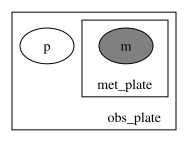

In [3]:
pyro.render_model(my_model, model_args=(ppi.mask, torch.tensor(ppi.met[:3,:], dtype=torch.float32), 3, torch.tensor(ppi.prot[:3,:], dtype=torch.float32)))

#needed to pip and mamba install? idk that was weird

#well... it did indeed visualize it lol. Just didn't get p from m, so that' smy issue, we can mention that

# tomorrow/sunday

Finish the model, basically instead of all the elements, just use the predict and no need to bring in the old ppi, that's sort of already done, then just use metabolites as well in a simple linear regression, shouldn't take too long even tho a shit tone of parameters. Basically a test case for my model, not what we'll actually do

Then train/fit the model with a small subset of the data, performance will be terrible, but mention future plans which is to integrate ppi with it, so far done solo, now will combine

Also need ideas for how to sample p from there, but that's a different question like if we use NF or what?

Draw my modle, we both know what it is, draw one for what we want to do and what we actually did.

In [1]:
# quickly load my updated_ppi.npy file
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
updated_ppi = np.load("updated_ppi.npy")
print(updated_ppi.shape)

(1028, 1028)


<Axes: >

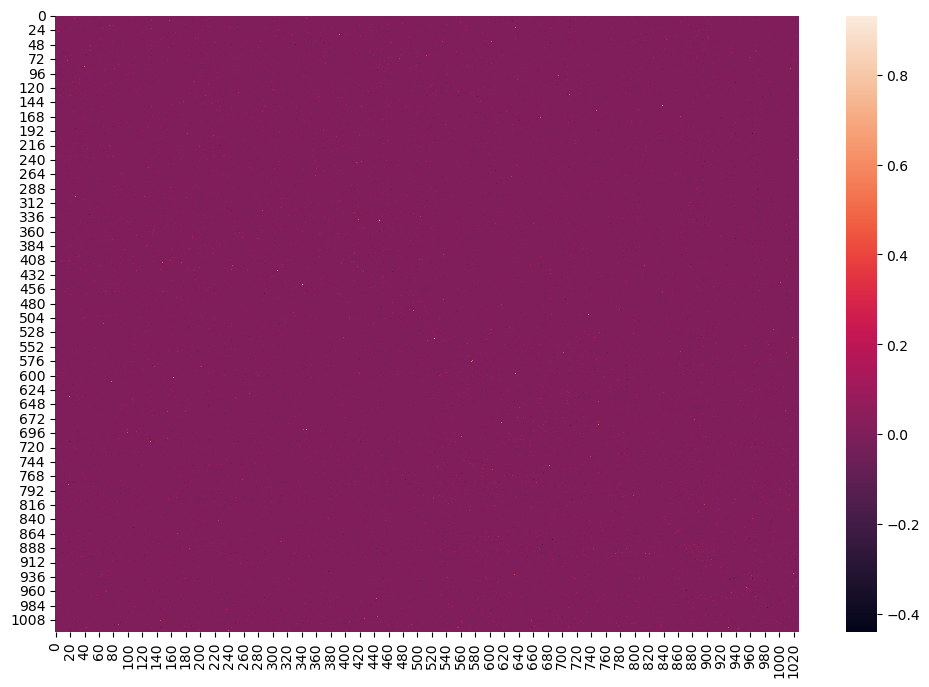

In [2]:
#now let's look at th eheatmap
plt.figure(figsize=(12,8))
sns.heatmap(updated_ppi)


# a few very highly correlated but the majority not ast all...

In [3]:
#now compare it to the ppi.mask and check to make sure all 0 values are still 0

#first check if all the nonzero values are in the same indices
print(sum(sum(updated_ppi != 0)))
print(sum(sum(ppi.mask != 0)))

#yeah, it's exactly the same! Now we'll go ahead and do a plot of all 3, also show how they compare and do other analyses on the most similar and different ones

155086
155086


# now do a very basic training

In [1]:
#Expect poor results, let's somehow use this updated adjacency matrix for prediction, no clue how we do it tho

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from tqdm import tqdm
import pingouin as pg

from utils import LoadData, PPI
from sklearn.metrics import mean_squared_error

dataloader = LoadData(impute='KNN',load = True)
ppi = PPI(dataloader)
#now we will have a different model, but the key idea is that we somehow need a normalizing flow term
import pyro
import pyro.distributions as dist
import torch
import torch.nn as nn
class PPI_Net(torch.nn.Module):
    def __init__(self):
        super(PPI_Net, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(251, 500)  # First linear layer
        self.layer2 = nn.Linear(500, 1000)  # Intermediate layer
        self.layer3 = nn.Linear(1000, 77543)  # Second linear layer

    def forward(self, metabolites):
        # Forward pass logic
        x = nn.functional.relu(self.layer1(metabolites))  # Applying ReLU after first layer
        x = nn.functional.relu(self.layer2(x))  # Applying ReLU after intermediate layer
        x = self.layer3(x)
        return x
    
class PPI_Net2(torch.nn.Module):
    def __init__(self):
        super(PPI_Net2, self).__init__()
        # Define layers
        self.layer1 = nn.Linear(527878, 5000)  # First linear layer
        self.layer2 = nn.Linear(5000, 3000)  # Intermediate layer
        self.layer3 = nn.Linear(3000, 1028)  # Second linear layer

    def forward(self, metabolites):
        # Forward pass logic
        x = nn.functional.relu(self.layer1(metabolites))  # Applying ReLU after first layer
        x = nn.functional.relu(self.layer2(x))  # Applying ReLU after intermediate layer
        x = self.layer3(x)
        return x
    
#see how l arge the model is
ppi_net = PPI_Net()
ppi_net2 = PPI_Net2()



In [17]:
def my_model(adj_mat = np.full((1028,1028), fill_value=None), m = None, n_obs = 100, adj_prob = torch.tensor((.1468)), p = None):
    #first define the priors
    # if n_obs is None:
    #     n_obs = m.shape[0]
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move model to GPU
    ppi_net.to(device)
    ppi_net2.to(device)

    # Ensure data is on GPU
    m = m.to(device)
    # if p:
    p = p.to(device)
    #adj_mat = torch.tensor(adj_mat).to(device)  # Ensure adj_mat is a tensor and on GPU
    #adj_prob = adj_prob.to(device)

    # Define plates
    obs_plate = pyro.plate('obs_plate', n_obs)
    met_plate = pyro.plate('met_plate', 251)
    prot_plate = pyro.plate('prot_plate', 1028)

    # Tensors for means and stds
    means = torch.zeros(251, device=device)
    stds = torch.ones(251, device=device)

    with met_plate:
        with obs_plate:
            m = pyro.sample('m', dist.Normal(means, stds), obs=m)

    # Neural network operation
    updated_ppi_params = ppi_net(m)
    
    #find nonzero indices of adj_mat
    
    linearize = ppi.linearize(adj_mat)
    #print(linearize.shape)
    #repeat it for each observation
    linearize = np.repeat(linearize[np.newaxis, :], n_obs, axis=0)
    # print(linearize.shape)
    # print(updated_ppi_params.shape)
    linearize = torch.tensor(linearize, dtype = torch.float32)
    linearize = linearize.to(device)
    # print(linearize.dtype)
    nonzero = linearize[0,:].nonzero().squeeze()
    linearize[:,nonzero] += updated_ppi_params
    p_mean = ppi_net2(linearize)
    p_scale = torch.ones(1028, device=device)
    
    with prot_plate:
        with obs_plate:
            #p_mean = 1#some_function_of(linearize)  # Define this function based on your model logic
            #p_scale = torch.tensor(1.0)  # Or some other logic for the scale/variance
            p = pyro.sample('p', dist.Normal(p_mean, p_scale), obs=p)
    
    
    
    #A = ppi_bernoulli_model(ppi_mask = adj_mat, prob = adj_prob)
    return p    
print(ppi.linearize(ppi.mask).shape)
print(ppi.prot.shape)
#linearize = my_model(ppi.mask, m = torch.tensor(ppi.met, dtype=torch.float32), n_obs = ppi.met.shape[0])
p = my_model(ppi.mask, m = torch.tensor(ppi.met[:3,:], dtype=torch.float32), n_obs = 3, p = torch.tensor(ppi.prot[:3,:], dtype=torch.float32))

(527878,)
(25818, 1028)


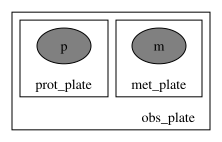

In [18]:
#now visualize it
pyro.render_model(my_model, model_args=(ppi.mask, torch.tensor(ppi.met[:3,:], dtype=torch.float32), 3, None,torch.tensor(ppi.prot[:3,:], dtype=torch.float32)))